# HBOS - Histogram- based outlier detection
### (HBOS) is an efficient unsupervised method. It assumes the feature independence and calculates the degree of outlyingness by building histograms.
Source: https://pyod.readthedocs.io/en/latest/pyod.models.html#module-pyod.models.hbos

### Arguments that work with HBOS algorithm:
1. contamination
2. n_bins
3. alpha
4. tol

In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2
import sys
import time
sys.path.insert(0,'../../../..')
import omama as O

Populating the interactive namespace from numpy and matplotlib


In [2]:
imgs = O.DataHelper.get2D(N = 100, config_num=7, randomize=True, timing=True)
downsampled_imgs = O.Normalize.downsample(imgs, flatten=True, timing=True)

get2D                    ...took    39.926050 seconds
image downsampling       ...took     0.564488 seconds
image downsampling       ...took     0.788886 seconds
image downsampling       ...took     1.014119 seconds
image downsampling       ...took     1.238477 seconds
image downsampling       ...took     1.463704 seconds
image downsampling       ...took     1.689728 seconds
image downsampling       ...took     2.172403 seconds
image downsampling       ...took     2.396348 seconds
image downsampling       ...took     3.697050 seconds
image downsampling       ...took     3.921751 seconds
image downsampling       ...took     4.145606 seconds
image downsampling       ...took     4.627571 seconds
image downsampling       ...took     4.851197 seconds
image downsampling       ...took     5.333906 seconds
image downsampling       ...took     5.816131 seconds
image downsampling       ...took     6.039551 seconds
image downsampling       ...took     6.265013 seconds
image downsampling       ...

In [6]:
train_scoresX, train_labelsX, accuracy = O.OutlierDetector.detect_outliers(features=downsampled_imgs,
                                                                 imgs=imgs,
                                                                 pyod_algorithm='HBOS',
                                                                 display=True,
                                                                 number_bad=24,
                                                                 accuracy_score=True,
                                                                 timing=True
                                                                    )

Running HBOS... HBOS accuracy: 0.16666666666666666
running HBOS             ...took     2.482112 seconds


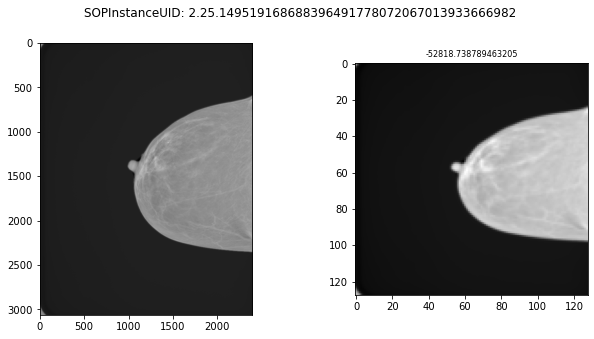

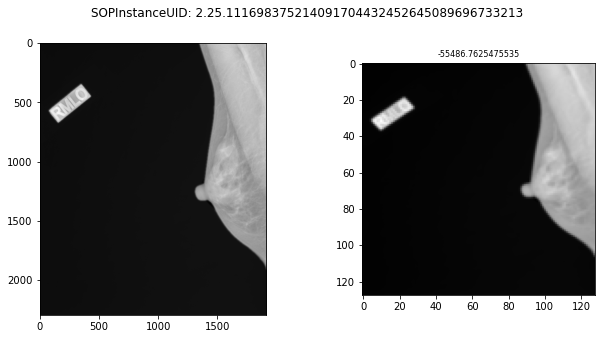

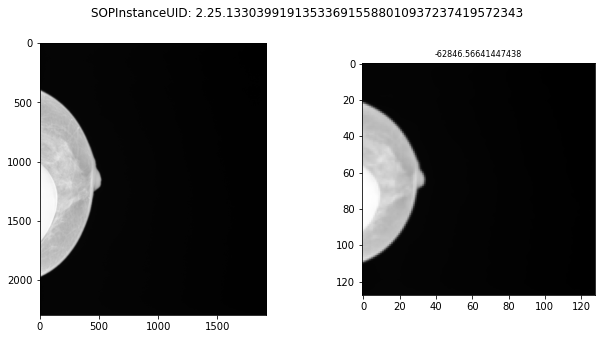

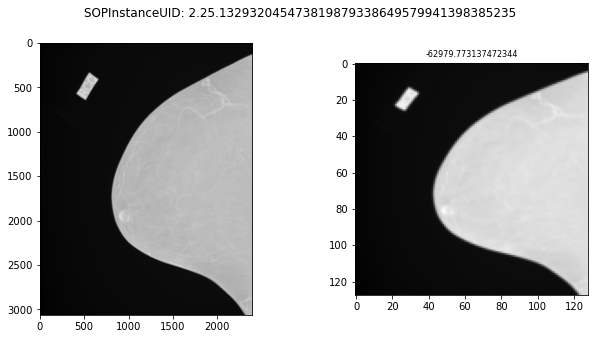

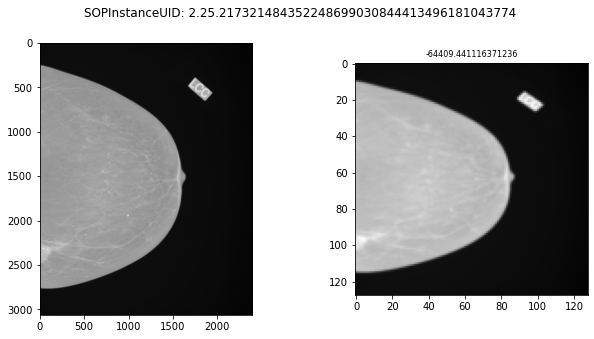

...

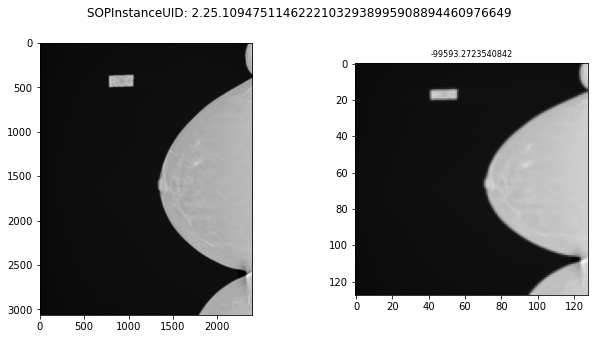

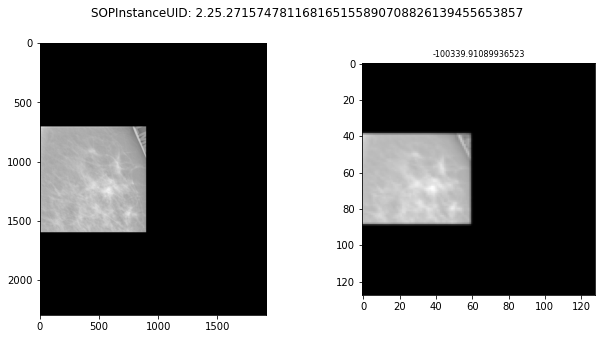

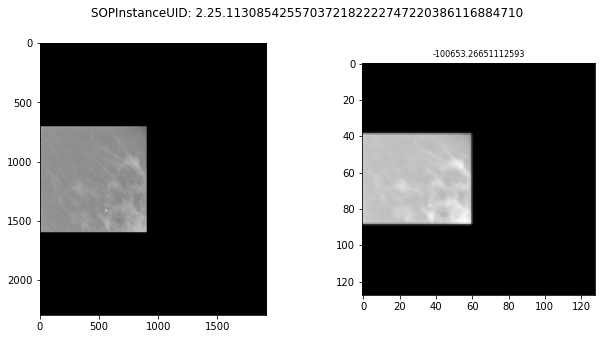

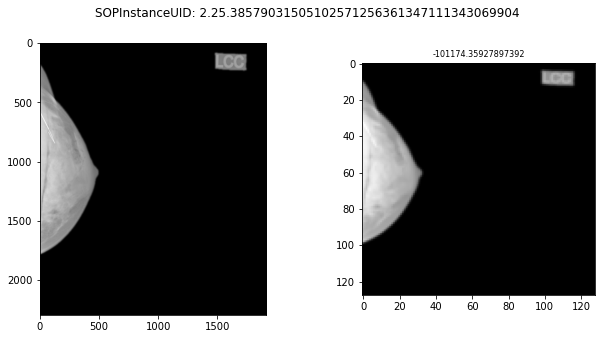

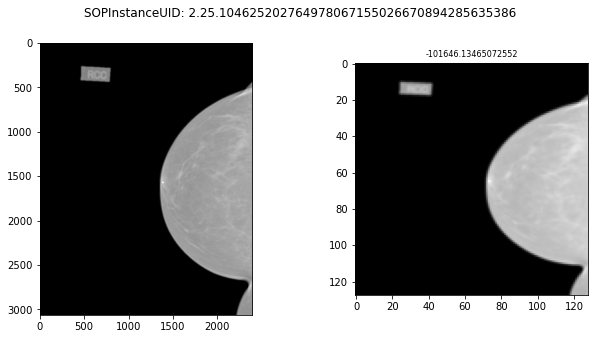

In [7]:
O.Features.view_image_and_features(imgs, ['downsample'], train_scores=[train_scoresX])

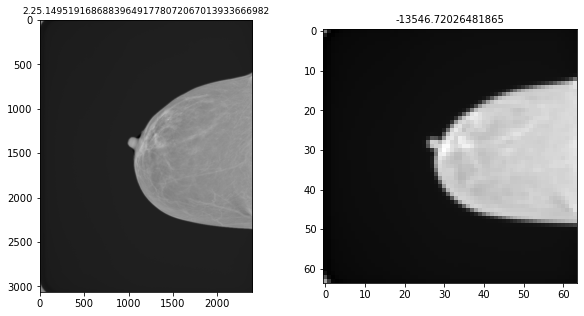

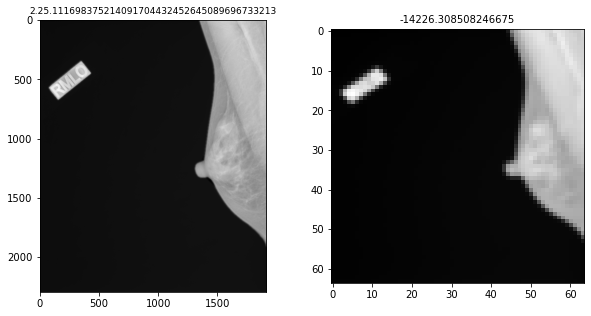

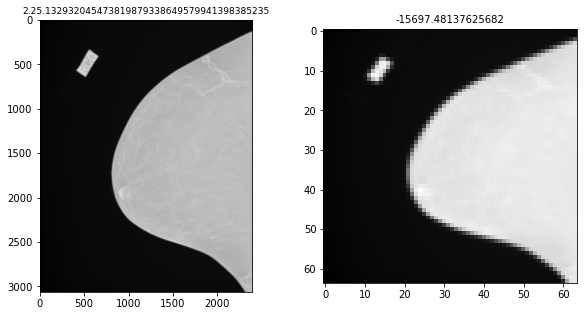

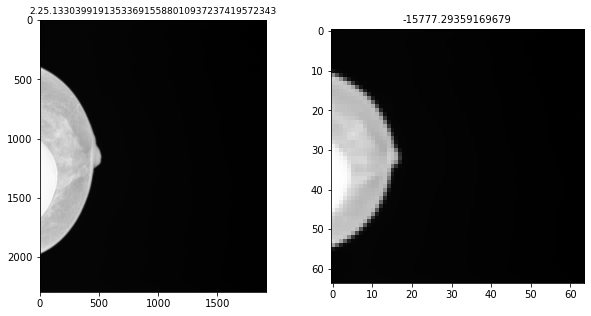

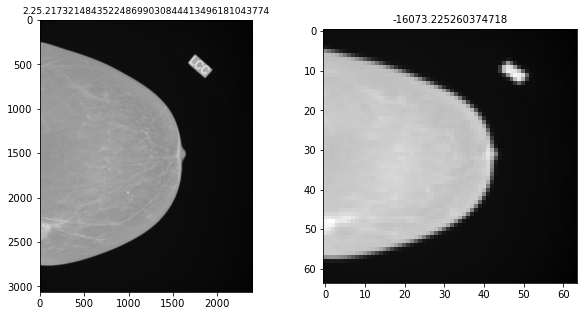

...

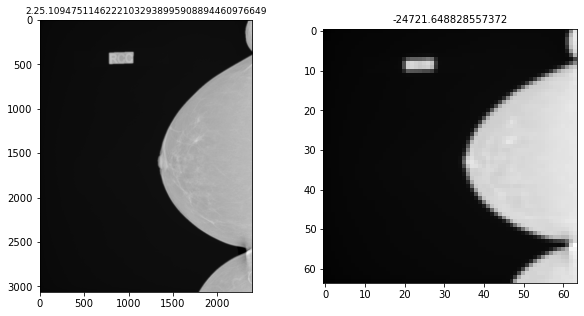

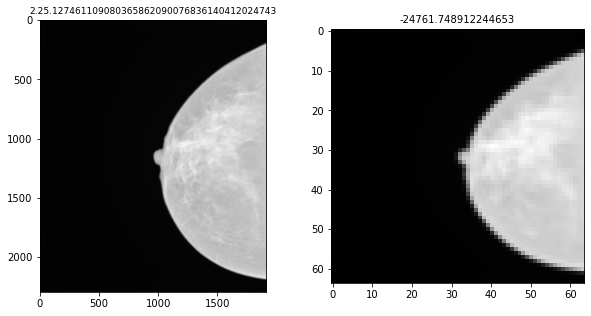

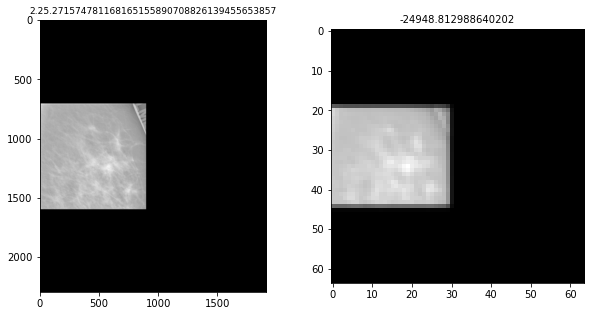

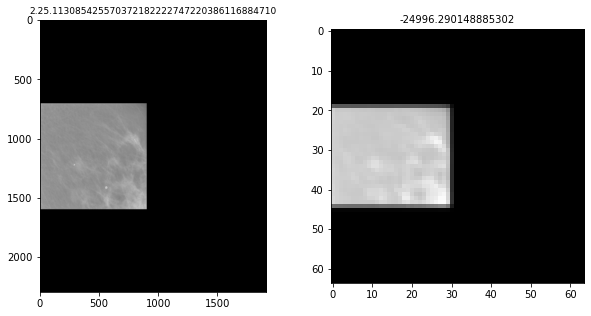

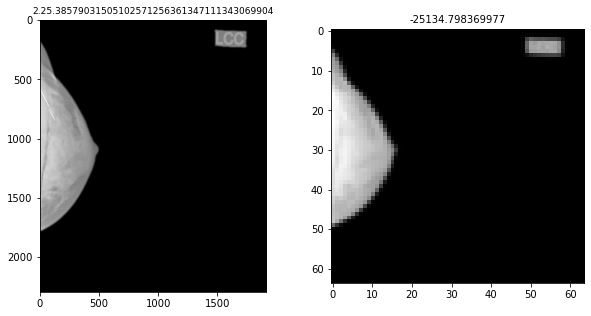

In [7]:
import json
import os

In [8]:
BAD_IMAGE_ID_PATH = r'/raid/mpsych/cache_files/bad_image_sopuids.txt'
CACHE_PATH = r'/raid/mpsych/cache_files/'
CACHE_FILE = r'outlier_detector_cache.json'
STATS_CACHE = r'outlier_stats_cache.json'
LOG_DIR = r'/raid/mpsych/cache_files/outlier_detection_logs/'

In [9]:
if os.path.exists(CACHE_PATH + STATS_CACHE):
    print('log file exists, updating...')
    with open(CACHE_PATH + STATS_CACHE, 'r') as f:
        log = json.loads(f.read())
else:
    print('log file does not exist, creating...')
    log = {}

log file exists, updating...


In [10]:
log

{'HBOS_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0,
  'max_accuracy': 0,
  'avg_accuracy': 0.0,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'HBOS',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'LOF_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.3333333333333333,
  'max_accuracy': 0.3333333333333333,
  'avg_accuracy': 0.3333333333333333,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'LOF',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'OCSVM_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.2916666666666667,
  'max_accuracy': 0.2916666666666667,
  'avg_accuracy': 0.2916666666666667,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'OCSVM',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'IForest_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.16666666666666666,
  'max_accuracy': 0.3333333333333333,
  'avg_accuracy': 0.25,
  'standard_deviation': 0.1178511301977579,
  'pyod_algori

In [11]:
log["ThisIsATest"] = {
    'min_accuracy': 99,
    'max_accuracy': 44,
    'avg_accuracy': 66,
    'standard_deviation': 44,
    'pyod_algorithm': 'pyod_algorithm',
    'norm_type': 'norm_type',
    'feature_type': 'feature_type',
    'n_runs': 6
}

# save the log
with open(CACHE_PATH + STATS_CACHE, 'w') as f:
    json.dump(log, f, indent=4)
    print(f'log saved to {CACHE_PATH + STATS_CACHE}')

log saved to /raid/mpsych/cache_files/outlier_stats_cache.json


In [12]:
if os.path.exists(CACHE_PATH + STATS_CACHE):
    print('log file exists, updating...')
    with open(CACHE_PATH + STATS_CACHE, 'r') as f:
        log = json.loads(f.read())
else:
    print('log file does not exist, creating...')
    log = {}


log file exists, updating...


In [13]:
log

{'HBOS_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0,
  'max_accuracy': 0,
  'avg_accuracy': 0.0,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'HBOS',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'LOF_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.3333333333333333,
  'max_accuracy': 0.3333333333333333,
  'avg_accuracy': 0.3333333333333333,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'LOF',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'OCSVM_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.2916666666666667,
  'max_accuracy': 0.2916666666666667,
  'avg_accuracy': 0.2916666666666667,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'OCSVM',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'IForest_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.16666666666666666,
  'max_accuracy': 0.3333333333333333,
  'avg_accuracy': 0.25,
  'standard_deviation': 0.1178511301977579,
  'pyod_algori

In [19]:
def sort_statistics_log():
    """ Sorts the statistics log best to worst by average accuracy
    """
    print('sorting statistics log...')
    with open(CACHE_PATH + STATS_CACHE, 'r') as f:
        log = json.loads(f.read())
        sorted_log = {}
    for key, value in sorted(log.items(),
                             key=lambda item: item[1]['avg_accuracy'],
                             reverse=True):
        sorted_log[key] = value
    with open(CACHE_PATH + STATS_CACHE, 'w') as f:
        json.dump(sorted_log, f, indent=4)
        print(f'log saved to {CACHE_PATH + STATS_CACHE}')
        
    f.close()

In [20]:
sort_statistics_log()

sorting statistics log...
log saved to /raid/mpsych/cache_files/outlier_stats_cache.json


In [21]:
if os.path.exists(CACHE_PATH + STATS_CACHE):
    print('log file exists, updating...')
    with open(CACHE_PATH + STATS_CACHE, 'r') as f:
        log = json.loads(f.read())
else:
    print('log file does not exist, creating...')
    log = {}

log file exists, updating...


In [18]:
log

{'ThisIsATest': {'min_accuracy': 99,
  'max_accuracy': 44,
  'avg_accuracy': 66,
  'standard_deviation': 44,
  'pyod_algorithm': 'pyod_algorithm',
  'norm_type': 'norm_type',
  'feature_type': 'feature_type',
  'n_runs': 6},
 'SUOD_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.7916666666666666,
  'max_accuracy': 0.7916666666666666,
  'avg_accuracy': 0.7916666666666666,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'SUOD',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'FB_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.75,
  'max_accuracy': 0.75,
  'avg_accuracy': 0.75,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'FB',
  'norm_type': 'max',
  'feature_type': 'downsample',
  'n_runs': 2},
 'AvgKNN_max_downsample_24%-errors_fe6a97': {'min_accuracy': 0.5833333333333334,
  'max_accuracy': 0.5833333333333334,
  'avg_accuracy': 0.5833333333333334,
  'standard_deviation': 0.0,
  'pyod_algorithm': 'AvgKNN',
  'norm_type': 'max',
  'feature_type': '